### Github link
https://github.com/JaQtae/SocInfo2022

#### Group members and student ID's.
* Jakob Sebastian Engel Ketmig, s194264
* Lasse Møller, s185927
* Alexander Valentini, s194252

#### Contribution statement
Everybody in the group contributed equally to each part of the exercises.

# Part 1
### Datasets for Computational Social Science
Consider the dataset collected in Week 1, and the 10 characteristics of Big Data from the book Bit by Bit section 2.3:
* **Big** How large is this dataset? Could this be collected via surveys?

<font color='blue'> The dataset contains 14715 submissions from 9317 authors with a total 637131 comments. It would be infeasible to garner the same amount of reach and respondents via surveys within a realistic time- and monetary frame.
</font> 

* **Always-on** Can you keep collecting data over time?

<font color='blue'> Yes, however we must note that the domain Reddit archives posts, ie. no more comments after a grace period, thus initially unique posts get reposted. 
</font> 


* **Non-reactive** Is the dataset non-reactive?

<font color='blue'> Yes, users of Reddit are likely not aware that their data is being gathered and used for other purposes like course material. Consequently, their actions and online activity is not affected by an awareness of being "observed".
</font> 

* **Incomplete** Does the dataset entirely capture the unfolding of events leading to GME stock rise in price?

<font color='blue'> According to news, the users of the subreddit influenced the GME stock price and thus it can be viewed as a lens into that, but it does not fully capture events outside of Reddit, ie. news articles, local or global changes in the stock market. 
</font> 

* **Inaccessible** Is the dataset accessible?

<font color='blue'> All information is public via API's.
</font> 

* **Non-repesentative** Will conclusions drawn from analysis of the dataset be GME specific or possible a lens for broader social phenomena? If so, why? If not, what makes it non-representative?

<font color='blue'> The primary analysis sheds light on GME specific behaviour, which is unique. However, it can be argued there are some interesting underlying social phenomena such as spreading the news in social network, group-identity and hype-trains. In this context, the GME case can be a prime sample to investigate such social phenomena.  
</font> 

* **Drifting** Is the drift in the period?

<font color='blue'> Primarily population drift. As hype was generated, more people joined the subreddit, thus also altering the community's behaviour in terms of thinking themselves as established, whereas previously it might be more rambunctious. Furthermore many of the new users were ordinary people with limited financial knowledge, which also causes a population and behavioral drift, as they could amplify the hype and sensational atmosphere.  
 
</font> 

* **Algorithmically confounded** Is it? If so, why?

<font color='blue'> Without a deep knowledge of the technical workings of the Reddit platform, it is difficult to state whether the data is algorithmically confounded. However, one probable feature of the Reddit application is that popular posts with a lot of interactions are more frequently shown to users, who haven't engaged with those particular submissions before, based on the assumption that such submissions are more likely to create more activity on and awareness about the platform. Reddit thus might have an interest in promoting submissions for which they have spotted a trend, which will artificially affect the trend due to the workings of the Reddit platform. 
</font> 

* **Dirty** What aspect may be dirty?

<font color='blue'> It is possible that the data contains submissions or comments from bot users, which may create a distorted image of how people actually engaged with the subject. Furthermore, some contents of posts might not even concern itself with GME - e.g. if the GME abbreviation is used for other things than the GameStop stock.
</font> 

* **Sensitive** Is there sensitive information?

<font color='blue'> Information gained from the API is not particularly sensitive. What the API takes is what has been consensually uploaded by the users themselves in the public space.  
</font> 

# Part 2
### Activity on Reddit and GME prices
* Download the GME market data.
* Use the comments dataset from Week 1, exercise 2.

### Part 2.1
* Plot the daily volume of the GME stock over time, the rolling average using a 7 days window, and use a log-scale on the y-axis.

In [1]:
import os
#print(os.getcwd())
os.chdir(r'C:\Users\JaQtae\Desktop\ComSocSci2022\Week 2 and 3')

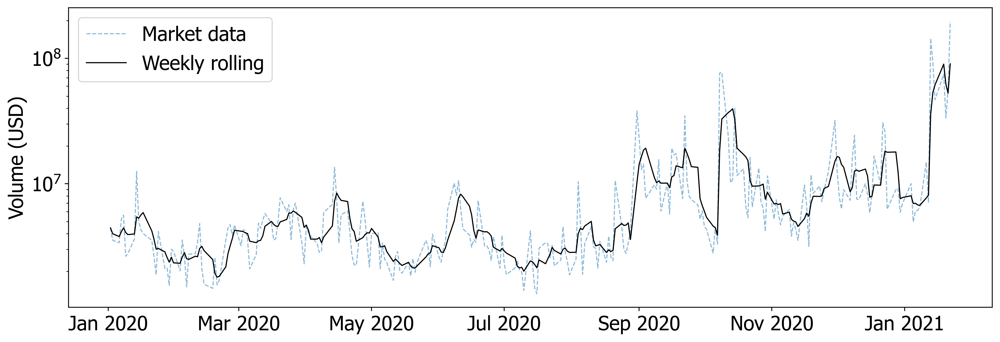

In [3]:
import os; import sys; import pandas as pd; import scipy as scipy
import datetime as dt; import matplotlib as mpl; import matplotlib.pyplot as plt
import matplotlib.dates as mdates; import seaborn as sns; import numpy as np
from scipy import stats; import networkx as nx; import netwulf as nw
#Specifying the MatPlotLib font and line width
def setup_mpl():
    mpl.rcParams['font.family'] = 'Tahoma'
    mpl.rcParams['font.size'] = 18
    mpl.rcParams['lines.linewidth'] = 1
setup_mpl()

GME = pd.read_csv('GME.csv', parse_dates=['Date']).set_index('Date')

com_data = pd.read_csv('wallstreetbets_comments.csv', parse_dates=['Unnamed: 0'], sep=",").set_index('Unnamed: 0')
com_data.index = com_data.index.rename('dates')

myFmt = mdates.DateFormatter('%b %Y')


com_day = com_data.groupby(com_data.index.date).count()
com_day = com_day.set_index(pd.DatetimeIndex(com_day.index))
com_day = com_day['id']

# Weekly rolling series
GME_wvol = GME['Volume'].rolling('7D').mean() # Weekly roll mean
com_wvol = com_day.rolling('7D').mean()


# Create plot of HME stock and rolling.
myFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots(figsize=(15,5), dpi=400)
ax.plot(GME.index, GME.Volume, ls='--', alpha=0.5)
ax.plot(GME_wvol.index, GME_wvol.values, color='k', label='1 week rolling')
ax.set_ylabel('Volume (USD)')
ax.set_yscale('log')
ax.xaxis.set_major_formatter(myFmt)
ax.legend(['Market data','Weekly rolling'])
plt.show()


<font color='blue'>
 The above figure shows the development in the volume of the GME stock in the period from 01-01-2020 to 25-01-2021.

* Do the same for comments on Reddit per day. Follow same steps as above.

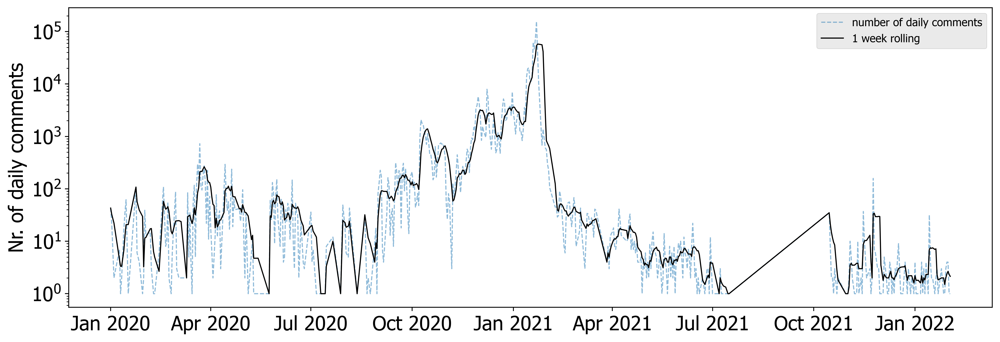

In [4]:
# Comments plot
fig, ax = plt.subplots(figsize=(15,5), dpi=400)
plt.style.use('ggplot')
ax.plot(com_day.index, com_day.values, ls='--', alpha=0.5, label="number of daily comments")
ax.plot(com_wvol.index, com_wvol.values, color='k', label='1 week rolling')
ax.set_ylabel('Nr. of daily comments')
ax.set_yscale('log')
ax.legend()
ax.xaxis.set_major_formatter(myFmt)
plt.show()

<font color='blue'>
 The above figure shows the development in the number of comments on submission in the r/wallstreetbets subreddit related to the GME stock in the period from 01-01-2020 to 25-02-2022. Note, the period between end of July till September coincides with it being made private, meaning comments were publicly available.

* What is the advantage of log-scale on y-axis and using a rolling-window?

<font color='blue'> Using a log-scale on the y-axis makes it possible to detect relative changes on a wide range of values. If the above plot was produced on a linear scale, only the peak around Jan. 2021 would be visible, as the remaining dates would be indiscernible from 0.
</font> 

    
<font color='blue'>The rolling average window smoothens out short-term fluctuations and highlights longer-term trends etc.
</font> 


* What are the <b> 3 </b>  most important observations you can draw by looking at the figures?

<font color='blue'>
(1)  There is a rising trend in both the volume and the number of comments related to the GME subreddit from ca. August 2020 to February 2021. The two measures appear correlated, which is only natural.  

(2) The magnitudal difference in comments is quite significant from start to peak traffic measured. 

(3) The smoothing feature of the rolling average for both figures allows us to analyze the trends without sudden changes skewing perception.
</font> 


### Part 2.2
* Compute daily log-returns of the closing price of GME stock.
* Compute daily log-change in number of new comments.
* Compute the correlation coefficient between the series computed in step 1 and step 2 (note that you need to first remove days without any comments from the time-series). Is the correlation statistically significant?


In [4]:
log_returns = np.log(GME['Close']/GME['Close'].shift(periods=1))
log_com_daily = np.log(com_day/com_day.shift(periods=1))

In [5]:
dfc = pd.DataFrame([log_returns, log_com_daily, GME['Close']]).transpose().dropna(axis=0) # row wise
dfc.columns = ['log_returns', 'log_com_daily', 'Closing Price']
corr = scipy.stats.pearsonr(dfc['log_returns'],dfc['log_com_daily'])
print('Dataset dfc:\n', dfc)
print(corr)

Dataset dfc:
             log_returns  log_com_daily  Closing Price
2020-01-09    -0.030171       1.252763       5.550000
2020-01-10    -0.021859      -1.945910       5.430000
2020-01-13     0.000000       2.140066       5.430000
2020-01-14    -0.142251       0.722135       4.710000
2020-01-15    -0.021460       0.571786       4.610000
...                 ...            ...            ...
2021-01-15    -0.117094       0.041488      35.500000
2021-01-19     0.103217       1.509931      39.360001
2021-01-20    -0.006116      -0.307517      39.119999
2021-01-21     0.095264       0.451573      43.029999
2021-01-22     0.412644       0.764622      65.010002

[199 rows x 3 columns]
(0.30420402622539094, 1.2523597897919578e-05)


<font color='blue'> 
The correlation between the daily log-returns and the daily log-change in the number of new comments is 0,3. 
Given the p-value below a typical significance level of 5%, this correlation is considered statistically significant, assuming that both series are normally distributed. 
    </font>

* Create scatter plot of daily log-return vs log-change in comments. Color markers for 2020 and 2021 in different colors and make the marker size proportional to the Closing price.

In [6]:
def setup_mpl():
    mpl.rcParams['font.family'] = 'Tahoma'
    mpl.rcParams['font.size'] = 10
    mpl.rcParams['lines.linewidth'] = 1
setup_mpl()

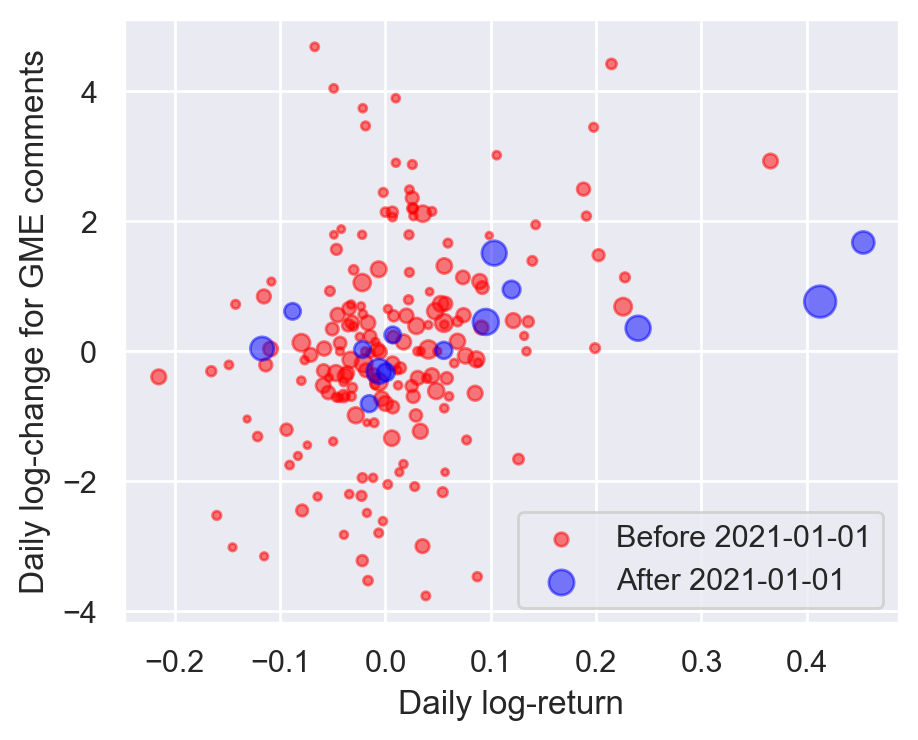

In [9]:
sns.set_theme()
plt.figure( figsize=(5,4), dpi=200)
dfc_end = dfc.loc[dfc.index < '2021-1-1']
dfc_start = dfc.loc[dfc.index > '2021-1-1']

plt.scatter(x=dfc_end['log_returns'], y=dfc_end['log_com_daily'],
            s = dfc_end['Closing Price']*2, alpha=0.5, color='red', label='Before 2021-01-01')
plt.scatter(x=dfc_start['log_returns'], y=dfc_start['log_com_daily'],
            s = dfc_start['Closing Price']*2, alpha=0.5, color='blue', label='After 2021-01-01')
plt.xlabel('Daily log-return')
plt.ylabel('Daily log-change for GME comments')
plt.legend(loc='lower right')
plt.show()

<font color='blue'>
 Above plot shows the scatterplot of daily change in comments on the r/wallstreetbets subreddit and the change in closing price of the Gamestop stock. The dot sizes are proportional to the closing price.

* What are the <b>3 </b> most salient observations you can draw by looking at the figure?

<font color='blue'> 
(1) The positive correlation between the two measures is evident from the plot. However there is a stronger positive correlation evedident in the data for the year 2021, as this marked a period of increased user activity on the subreddit and a substantial increase in the stock price. 


(2) The 2020 points look to be centered on a daily log-return of 0 indicating that the daily returns were both positive and negative. This is different for the few 2021 points which look to have a tendency of being on days with a positive log return. This makes sense as a larger log-return (e.g. the one above 0.4) is equivalent to a ca. 50% increase in price, which corresponds with the higher closing prices.

(3) The daily log-changes in the number of comments span a significantly wider range compared to the log-return in the stock price.  
    </font>


* Based on the exploratory data visualization in Exercises 2 and 3, what can you conclude on the research question: *Is the activity on r/wallstreetbets related to the price of the GME stock*?

<font color='blue'> 
Yes, by previous arguments and what has been shown in plots, there is an obvious relation!
        </font>

# Part 3
### Exercises using the NetworkX library
* Solve exercise **2.1**, **2.3**, and **2.5** in your notebook.

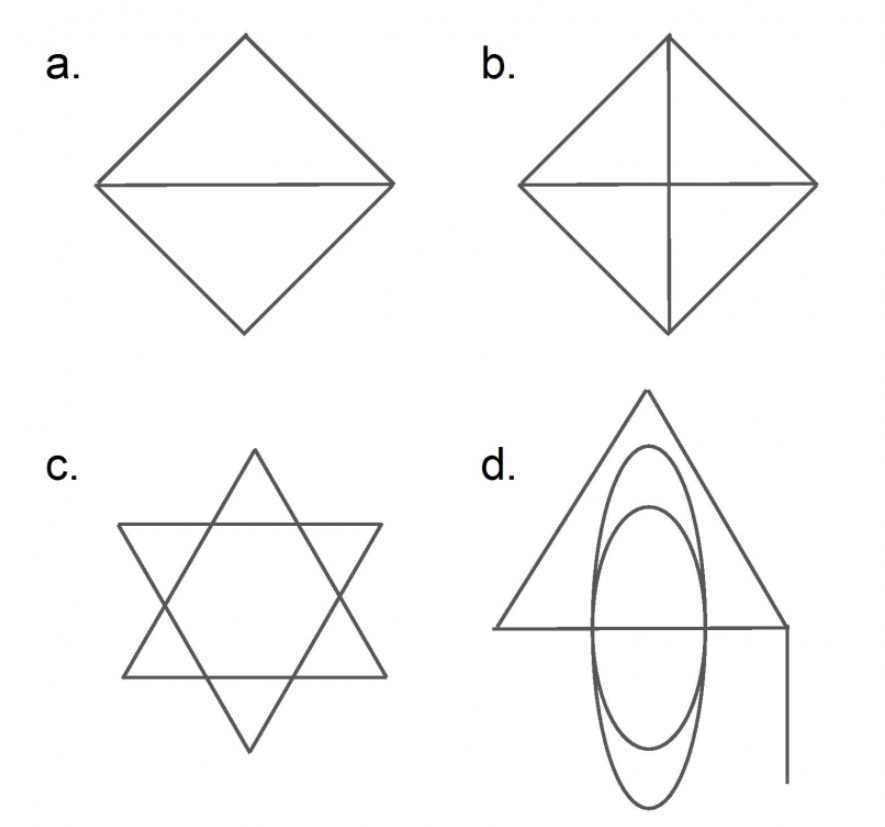

In [35]:
#Exercise 2.1
from IPython.display import Image
Image("C:/Users/Lasse/Desktop/DTU/6. semester/Social informatik/Github - comsocsci2022/Exercise 2.1.png")

#### Exercise 2.3 - The Königsberg Problem
Which of the icons the image above can be drawn without raising your pencil from the paper, and without drawing any line more than once? Why?

<font color='blue'>
As Euler realized when trying to find the famous bridge-walking path in Königsberg, the problem of drawing the above images without raising your pencil from the paper can be modeled as a graph problem in which a Eulerian path is to be found. That is, if every corner, line crossing and single line endings are modeled as nodes and the connecting lines as edges, the problem can be reformulated as finding a path on the associated graph that traverses every edge only once. To quickly determine whether such a path can be found, it is only a matter of counting the number of nodes with an uneven degree, as these nodes must either be the starting or end point of a Eulerian path. If there are more than two of such nodes, a Eulerian path does not exist, and consequently it is not possible to draw the image as described. <br>
    
   Image A has exactly 2 nodes with uneven degree and <b> can be drawn </b> as described. <br>
Image B has more than 2 nodes with uneven degree and <b> cannot be drawn </b> as described.<br>
Image C has only nodes with even degree and <b> can be drawn </b> as described.<br>
Image D has only nodes with even degree and <b> can be drawn </b> as described.
</font>


#### 2.3 - Graph representation
The adjacency matrix is a useful graph representation for many analytical calculations. However, when we need to store a network in a computer, we can save computer memory by offering the list of links in a Lx2 matrix, whose rows contain the starting and end point i and j of each link. Construct for the networks (left) and (right) <br>

* The corresponding adjacency matrices.



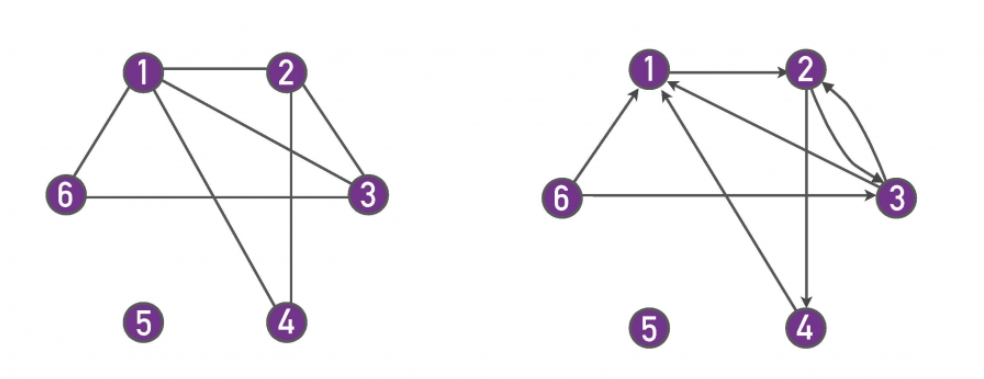

In [36]:
#Exercise 2.3
from IPython.display import Image
Image("C:/Users/Lasse/Desktop/DTU/6. semester/Social informatik/Github - comsocsci2022/Exercise 2.3.png")

In [101]:
#UNDIRECTED
print("\nUndirected Graph:")
UG = nx.Graph()
UG.add_edges_from([(1, 2), (1, 3), (1, 4), (1, 6), (2, 4), (6, 3), (2, 3)])
UG.add_node(5)

Adj_matrix_UG = nx.adjacency_matrix(UG).todense()
print(Adj_matrix_UG)

# DIRECTED
print("\nDirected Graph:")
DG = nx.DiGraph()
DG.add_nodes_from([1, 2, 3, 4, 5, 6])
DG.add_edges_from([(1, 2), (2, 3), (3, 2), (6, 3), (3, 1), (6, 1), (4, 1), (2,4)])

Adj_matrix_DG = nx.adjacency_matrix(DG).todense()
print(Adj_matrix_DG)


Undirected Graph:
[[0 1 1 1 1 0]
 [1 0 1 1 0 0]
 [1 1 0 0 1 0]
 [1 1 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]]

Directed Graph:
[[0 1 0 0 0 0]
 [0 0 1 1 0 0]
 [1 1 0 0 0 0]
 [1 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 1 0 0 0]]


* The corresponding link lists.

In [59]:
#UNDIRECTED
print("\nUndirected Graph:")
for line in nx.generate_edgelist(UG, data=False):
    print("[" + line + "]")
    

#DIRECTED
print("\nDirected Graph:")
for line in nx.generate_edgelist(DG, data=False):
    print("[" + line + "]")


Undirected Graph:
[1 2]
[1 3]
[1 4]
[1 6]
[2 4]
[2 3]
[3 6]

Directed Graph:
[1 2]
[2 3]
[2 4]
[3 2]
[3 1]
[4 1]
[6 3]
[6 1]


* Determine the average clustering coefficient of the network shown in Image 2.20a

In [70]:
#UNDIRECTED
print("\nUndirected Graph:")
lst = list(nx.clustering(UG).values())
lst = [float(i) for i in lst]

print("Average clustering coefficient: %.3f" % np.mean(lst))


Undirected Graph:
Average clustering coefficient: 0.639


* If you switch the labels of nodes 5 and 6 in Image 2.20a, how does that move change the adjacency matrix? And the link list?

In [80]:
print("BEFORE SWITHCING LABELS")
mapping = {5: 6, 6: 5}
UG_switch = nx.relabel_nodes(UG, mapping)

Adj_matrix_UG = nx.adjacency_matrix(UG).todense()
print(Adj_matrix_UG)

print("\n")
#UNDIRECTED
for line in nx.generate_edgelist(UG, data=False):
    print("[" + line + "]")
    

print("\n")
print("AFTER SWITHCING LABELS")

Adj_matrix_UG_switch = nx.adjacency_matrix(UG_switch).todense()
print(Adj_matrix_UG_switch)

print("\n")
for line in nx.generate_edgelist(UG_switch, data=False):
    print("[" + line + "]")

BEFORE SWITHCING LABELS
[[0 1 1 1 1 0]
 [1 0 1 1 0 0]
 [1 1 0 0 1 0]
 [1 1 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]]


[1 2]
[1 3]
[1 4]
[1 6]
[2 4]
[2 3]
[3 6]


AFTER SWITHCING LABELS
[[0 1 1 1 1 0]
 [1 0 1 1 0 0]
 [1 1 0 0 1 0]
 [1 1 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]]


[1 2]
[1 3]
[1 4]
[1 5]
[2 4]
[2 3]
[3 5]


 <font color='blue'>
There is not visible change to the contents of the adjacency matrix. However the change is in the indexing of the rows and columns. Thus the row/column index before the label switch is [1, 2, 3, 4, 6, 5] and [1, 2, 3, 4, 5, 6] after. <br>
As seen in the link list, the label switch has occured correctly.

 </font>

* What kind of information can you not infer from the link list representation of the network that you can infer from the adjacency matrix? <br>

<font color='blue'>
From the adjacency matrix it is possible to infer whether the graph is connected or not by rearranging the matrix into a block diagonal form, which makes it possible to identify the number of connected components in the graph. This is not a feasible task using the link list. <br>
    
The adjacency matrix also allows for easily determining whether there is any path is valid, as this can be expressed as a product of the matrix elements corresponding to the visited nodes.

Futhermore, the adjacency matrix allows for easy computation of the degrees of the nodes 
</font>

* In the (a) network, how many paths (with possible repetition of nodes and links) of length 3 exist starting from node 1 and ending at node 3? And in (b)? <br>
<font color='blue'>
There are 5 such paths in the (a) network:
<ol>
    <li>1->2->1->3</li>
    <li>1->3->1->3</li>
    <li>1->6->1->3</li>
    <li>1->4->1->3</li>
    <li>1->4->2->3</li>
</ol>
<br>
    There are not such paths in the (b) network.
</font>

* *Optional*: With the help of a computer, count the number of cycles of length 4 in both networks.

#### Network (a)

In [112]:
# Python Program to count
# cycles of length n
# in a given graph.
  
# Number of vertices
V = len(UG.nodes)
 
def DFS(graph, marked, n, vert, start, count):
 
    # mark the vertex vert as visited
    marked[vert] = True
  
    # if the path of length (n-1) is found
    if n == 0:
 
        # mark vert as un-visited to make
        # it usable again.
        marked[vert] = False
  
        # Check if vertex vert can end with
        # vertex start
        if graph[vert][start] == 1:
            count = count + 1
            return count
        else:
            return count
  
    # For searching every possible path of
    # length (n-1)
    for i in range(V):
        if marked[i] == False and graph[vert][i] == 1:
 
            # DFS for searching path by decreasing
            # length by 1
            count = DFS(graph, marked, n-1, i, start, count)
  
    # marking vert as unvisited to make it
    # usable again.
    marked[vert] = False
    return count
  
# Counts cycles of length
# N in an undirected
# and connected graph.
def countCycles( graph, n):
 
    # all vertex are marked un-visited initially.
    marked = [False] * V
  
    # Searching for cycle by using v-n+1 vertices
    count = 0
    for i in range(V-(n-1)):
        count = DFS(graph, marked, n-1, i, i, count)
  
        # ith vertex is marked as visited and
        # will not be visited again.
        marked[i] = True
     
    return int(count/2)
  
# main :
graph = Adj_matrix_UG.tolist()
           
n = 4
print("Total cycles of length ",n," are ",countCycles(graph, n))
 
# this code is contributed by Shivani Ghughtyal
#https://www.geeksforgeeks.org/cycles-of-length-n-in-an-undirected-and-connected-graph/

Total cycles of length  4  are  2


#### Network (b)
Not solved.

#### 2.3 - Bi-partite networks
Consider the bipartite network in the image below

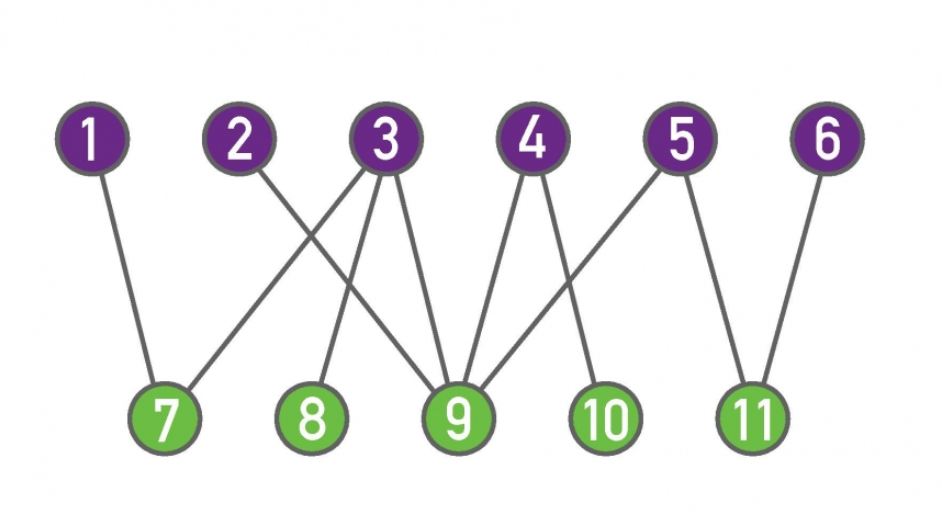

In [113]:
#Exercise 2.3
from IPython.display import Image
Image("C:/Users/Lasse/Desktop/DTU/6. semester/Social informatik/Github - comsocsci2022/Exercise 2.5.png")

* Construct its adjacency matrix. Why is it a block-diagonal matrix?


Adjacency matrix:

[[0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 1 1 0 0]
 [0 0 0 0 0 0 0 0 1 1 0]
 [0 0 0 0 0 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 1]
 [1 0 1 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 0 0 0 0 0]]


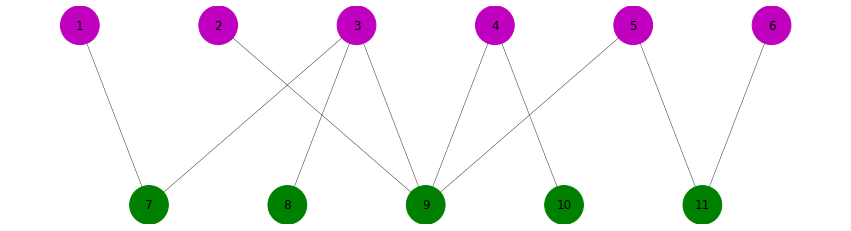

In [149]:
from networkx.algorithms import bipartite
BiGraph = nx.Graph()
BiGraph.add_nodes_from([1, 2, 3, 4, 5, 6], bipartite = 0)
BiGraph.add_nodes_from([7, 8, 9, 10, 11], bipartite = 1)
BiGraph.add_edges_from([(1,7), (7,3), (3,8), (3,9), (2,9), (4,9), (5,9), (4,10), (5,11), (11,6)])

Adj_matrix_BiGraph = nx.adjacency_matrix(BiGraph).todense()
print("Adjacency matrix:\n")
print(Adj_matrix_BiGraph)

color = bipartite.color(BiGraph)

color_dict = {0:'m',1:'g'}

color_list = [color_dict[i[1]] for i in BiGraph.nodes.data('bipartite')]

m, n = 7, 6
K = nx.complete_bipartite_graph(m, n)
pos = {}
pos.update((i, (i-1 - m/2, 1)) for i in range(m))
pos.update((i, (i - m - n/2, 0)) for i in range(m, m + n))

fig, ax = plt.subplots()
fig.set_size_inches(15, 4)
#BiGraph = bipartite.color(BiGraph)
nx.draw(BiGraph, with_labels=True, pos=pos, node_size=1500, width=0.4, node_color=color_list )
#bipartite.color(BiGraph)
plt.show()

<font color = 'blue'>
The adjacency matrix is block diagonal as there are no edges between two nodes on the same side (of the same color). 
</font>


* Construct the adjacency matrix of its two projections, on the purple and on the green nodes, respectively.


In [150]:
Projection_1 = bipartite.projected_graph(BiGraph, [1, 2, 3, 4, 5, 6])

Adj_matrix_Proj1 = nx.adjacency_matrix(Projection_1).todense()
print("Adjacency matrix of projection 1:\n")
print(Adj_matrix_Proj1)



Projection_2 = bipartite.projected_graph(BiGraph, [7, 8, 9, 10, 11])

Adj_matrix_Proj2 = nx.adjacency_matrix(Projection_2).todense()
print("\nAdjacency matrix of projection 2:\n")
print(Adj_matrix_Proj2)



Adjacency matrix of projection 1:

[[0 0 1 0 0 0]
 [0 0 1 1 1 0]
 [1 1 0 1 1 0]
 [0 1 1 0 1 0]
 [0 1 1 1 0 1]
 [0 0 0 0 1 0]]

Adjacency matrix of projection 2:

[[0 1 1 0 0]
 [1 0 1 0 0]
 [1 1 0 1 1]
 [0 0 1 0 0]
 [0 0 1 0 0]]


* Calculate the average degree of the purple nodes and the average degree of the green nodes in the bipartite network.


In [173]:
sum_degree_purple = np.sum(np.sum(Adj_matrix_BiGraph[0:6], axis=1))
avg_deg_purple = sum_degree_purple/6
print("Average degree of the purple nodes: " + str(avg_deg_purple))

sum_degree_green = np.sum(np.sum(Adj_matrix_BiGraph[6:], axis=1))
avg_deg_green = sum_degree_green/5
print("\nAverage degree of the green nodes: " + str(avg_deg_green))

Average degree of the purple nodes: 1.6666666666666667

Average degree of the green nodes: 2.0


* Calculate the average degree in each of the two network projections. Is it surprising that the values are different from those obtained in point (c)?

In [163]:
L1 = np.sum(Adj_matrix_Proj1)/2
N1 = Adj_matrix_Proj1.shape[0]
avg_deg_purple = 2*L1/N1
print("Average degree of projection 1: " + str(avg_deg_purple))

L2 = np.sum(Adj_matrix_Proj1)/2
N2 = Adj_matrix_Proj2.shape[0]
avg_deg_green = 2*L2/N2
print("Average degree of projection 2: " + str(avg_deg_green))

Average degree of projection 1: 2.6666666666666665
Average degree of projection 2: 3.2


<font color='blue'>
It is not surprising that the values are different as they express different characteristics of the network. <br>
The average degree of the purple nodes describes the average number of edges from a purple node to green nodes. <br>
The average degree of e.g. projection 1 describes the average number of other purple nodes that a purple node is indirectly linked to via a green node. 
    


# Part 4
### Properties of real-world network of Redditors


### Part 4.1
* Compute the value of *p* such that number of expected edges of random netowrk equals the number of edges in the number of edges in the Reddit network. What is the value of *p*? Compure the average value of the degree < k > using the formula.


Finding *p* such that the condition is met using (3.2):
$$<L>=p * \frac{N(N-1)}{2}$$
Isolating *p*:
$$ p = \frac{2<L>}{N(N-1)}$$

The average value of the degree is found by (3.3):
$$<k> = \frac{2L}{N} = p(N-1)$$


In [30]:
# Since json was corrupted, we redo week 3
com_authors = dict(zip(com_data['id'], com_data['author']))
parent = dict(zip(com_data['id'], com_data['parent_id']))
sub_authors = dict(zip(sub_data['id'], sub_data['author']))
def authID(com_id):
    if parent[com_id][:3] == "t1_":
        auth = com_authors.get(parent[com_id][3:], None)
    else:
        auth = sub_authors.get(parent[com_id][3:], None)
    return auth
com_data['parent_author'] = com_data['id'].apply(authID)
cd_ = com_data[(com_data.index < '2021-12-01')]
cd_ = cd_.drop(cd_[cd_['author'] == '[deleted]'].index) # remove deleteds
cd_ = cd_.drop(cd_[cd_['parent_author'] == '[deleted]'].index) # Remove deleteds
cd_ = cd_.drop(cd_[cd_['parent_author'].isna()].index) # Remove NaN's
# We make an undirected graph of reciprocal edges. 
edges = cd_.groupby(['author', 'parent_author']).count()
edges = edges.drop(['id', 'link_id', 'parent_id'], axis=1)
G = nx.DiGraph()
# Add all edges and remake to reciprocal.
G.add_weighted_edges_from([ (a, b, edges['score'].loc[(a,b)]) for a, b in edges.index ])
G_U = G.to_undirected(reciprocal=True)

for node, ngbr, w in G_U.edges.data('weight'):
    # Undirected edge weights equal to sum of weights in two corresponding directed edges
    G_U.edges[node, ngbr]['weight'] = (G.edges[node, ngbr]['weight'] + G.edges[ngbr, node]['weight'])
    
# Finally, remove isolated nodes and self-loops in graph.
G_U.remove_nodes_from(list(nx.isolates(G_U))) 
G_U.remove_edges_from(nx.selfloop_edges(G_U))

print('Nodes: {}'.format(G_U.number_of_nodes()))
print('Edges: {}'.format(G_U.number_of_edges()))
L = len(G_U.edges)
N = len(G_U.nodes)
p = 2*L/(N*(N-1))
print(f'p={p * 100:.2f}%')
k = 2*L/N
print('k: {:.3f}'.format(k))

Nodes: 28544
Edges: 50380
p=0.01%
k: 3.530


* Create a random network with same number of node as the Reddit network and *p* as above. Generate a random network by linking nodes in every possible pair with probability *p*.

In [31]:
Random_graph = nx.generators.random_graphs.erdos_renyi_graph(N,p)

* Visualize the Reddit network and the random network. Comment on the differences.



Stark difference for the random network vs. real wrt. the lack of local clustering charasteristics. The density of links seem to extend further for the random network.



### Reddit network

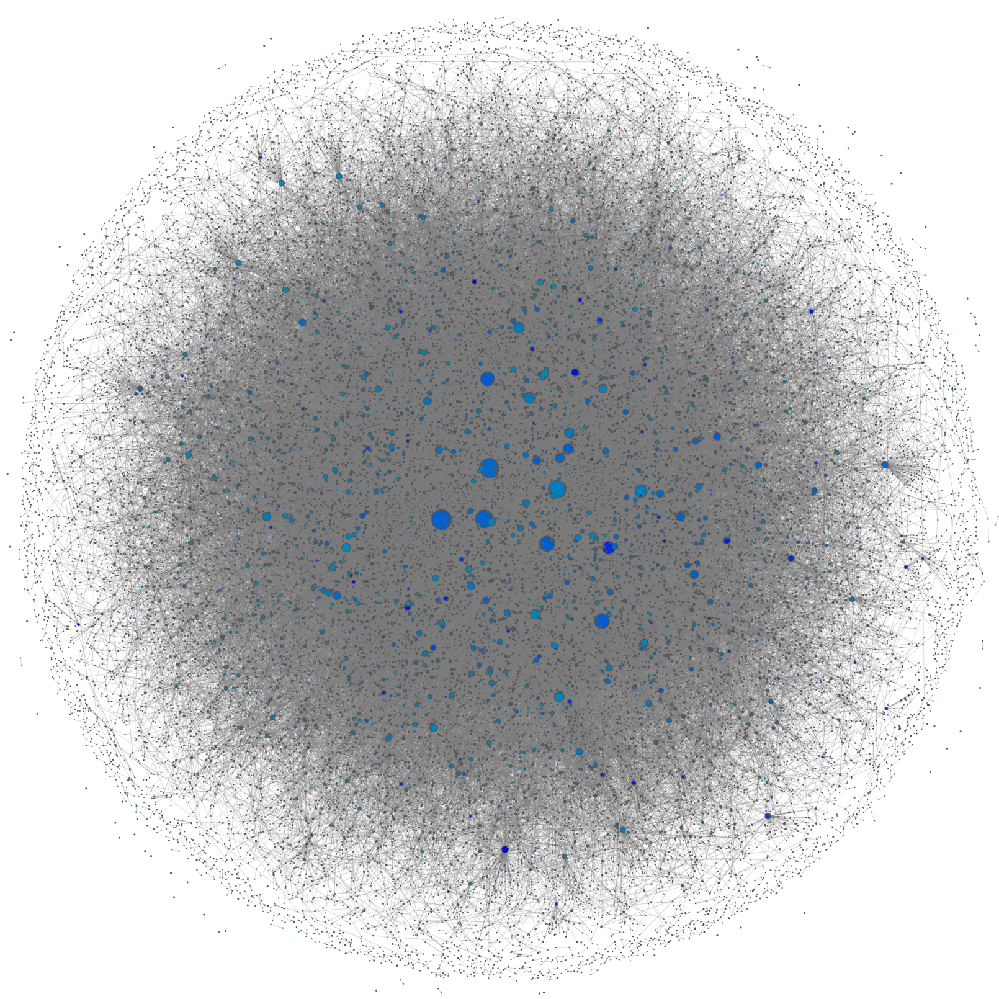

In [3]:
from IPython.display import Image
Image(filename="Images/Reddit.png",width=600, height=400)

### Random network

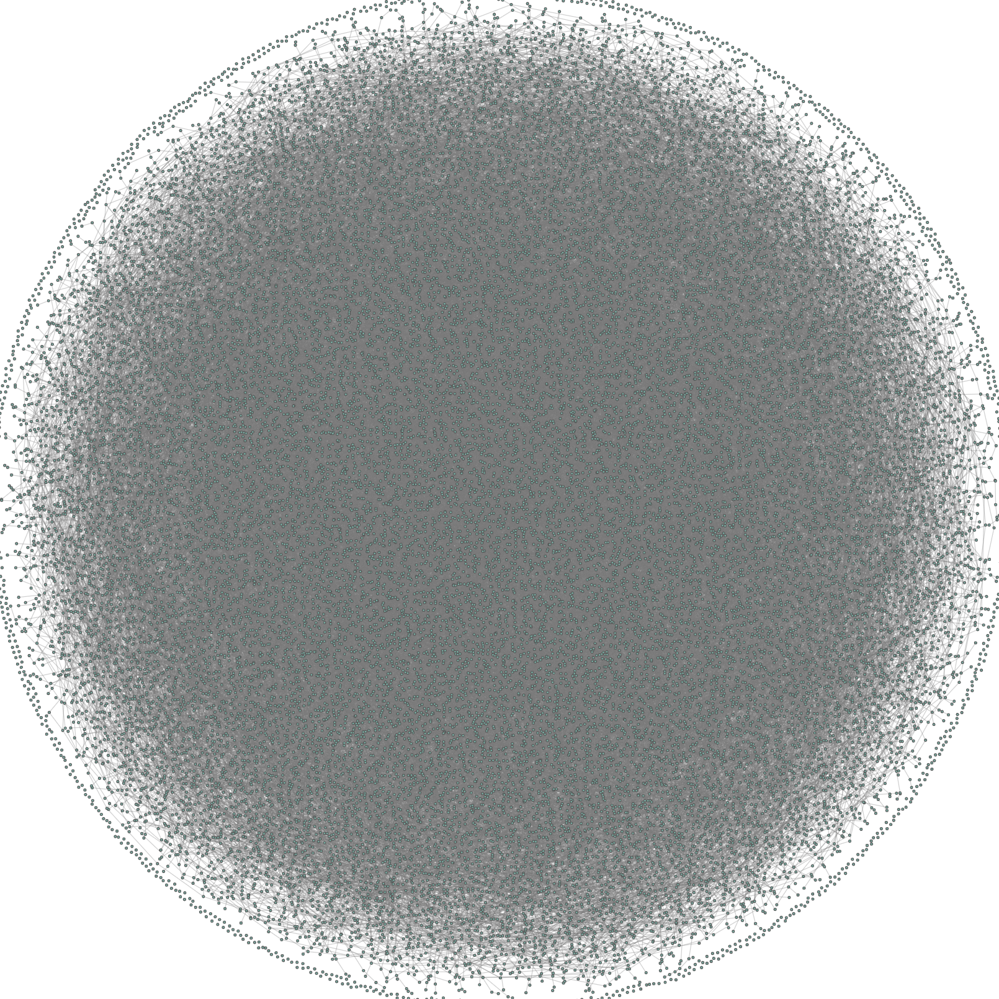

In [4]:
from IPython.display import Image
Image(filename="Images/Random.png",width=600, height=400)

### Part 4.2
#### Clustering
* Compute the clustering coefficient for all nodes in the random network using formula (2.15) from the book.
* Compute the average clustering coefficient for nodes in the random and redditors network, respectively. How does it compare to the random counterpart? Is it something you expected? Why?

In [36]:
# Random
degrees = [x[1] for x in Random_graph.degree]
print('minDeg: {} | maxDeg: {}'.format(min(degrees), max(degrees)))
C = []
for node in Random_graph.nodes():
    neighbors = Random_graph.neighbors(node)
    subgraph_neighbors = Random_graph.subgraph(neighbors).copy()
    L_i = len(subgraph_neighbors.edges)
    C.append((2*L_i) / (Random_graph.degree(node) * (Random_graph.degree(node) - 1) + 1e-6)) #Few notes have 
lst = list(nx.clustering(Random_graph).values())
lst = [float(i) for i in lst]
from collections import Counter
Counter(C)

minDeg: 0 | maxDeg: 14


Counter({0.0: 28517,
         0.022222221975308647: 3,
         0.09999999500000024: 8,
         0.03571428507653063: 2,
         0.0476190464852608: 3,
         0.16666665277777895: 7,
         0.33333327777778704: 2,
         0.99999950000025: 1,
         0.027777777391975313: 1})

In [37]:
# Check for method, works out.
print('Book: \n C_avg_book: {:.6f}  |  p_book: {:.6f}'.format(np.mean(C),np.mean(degReddit)/len(degReddit)))
print('Networkx: \n C_avg_nx: {:.6f}  |  p_nx: {:.6f}'.format(np.mean(lst),p))

Book: 
 C_avg_book: 0.000138  |  p_book: 0.000124
Networkx: 
 C_avg_nx: 0.000138  |  p_nx: 0.000124


In [38]:
# Reddit
degReddit = [x[1] for x in G_U.degree]
print('minDeg: {} | maxDeg: {}'.format(min(degReddit), max(degReddit)))
C = []
for node in G_U.nodes():
    neighbors = G_U.neighbors(node)
    subgraph_neighbors = G_U.subgraph(neighbors).copy()
    L_i = len(subgraph_neighbors.edges)
    k_i = G_U.degree(node)
    C.append((2*L_i) / (k_i * (k_i - 1) + 1e-6)) #Few nodes only have k_i = 1
lst = list(nx.clustering(G_U).values())
lst = [float(i) for i in lst]
print('C_avg: {:.6f}  |  p: {:.6f}'.format(np.mean(C),np.mean(degReddit)/len(degReddit)))

minDeg: 0 | maxDeg: 652
C_avg: 0.010054  |  p: 0.000124


<font color='blue'>
    Real networks are locally more dense in terms of clustering. Hence,  we have several orders of magnitude difference in the clustering coefficient on average across all nodes. In the random network <b> C </b> depends on the size, while size does not influence <b> C </b> for real networks.
    
Additionally, the random network has no particular popular nodes, which is a phenomena often found in reality, e.g. social media as in reality, particularly in social contexts, not everyone are equally linked probability wise. 
</font>